In [28]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
def pinf(V):
    return 1.0/(1+np.exp(-(V--47)/3))#can range from -47 to -41 #
def ninf(V):
    return 1.0/(1+np.exp(-(V--35)/10))
def taun(V):
    return 0.1 + 0.5*(1.0/(1+np.exp(-(V--27)/-15)))
def Zinf(V):
    return 1.0/(1+np.exp(-(V--39)/5))
def hinf(V):
    return  1.0/(1+np.exp(-(V--45)/-7))
def minf(V):
    return 1.0/(1+np.exp(-(V--30)/9.5))
def tauh(V):
    return 0.1 + 0.75*(1.0/(1+np.exp(-(V--40.5)/-6)))
def Hinf(V):
    return 1./(1. + np.exp((V + 84.)/10.2))
def tauH(V):
    return  1./(np.exp(-17.9 - 0.116*V ) + np.exp(-1.84 + 0.09*V )) + 0.1





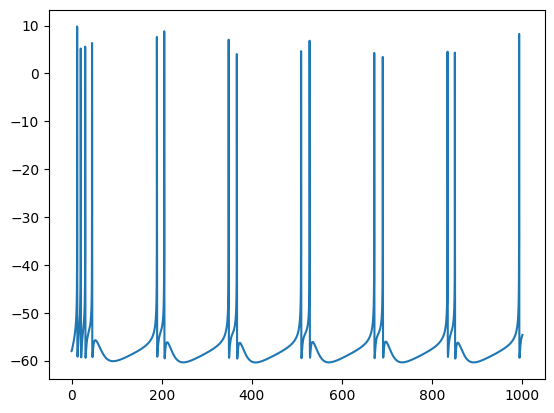

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks



dt = 0.1    

t = np.arange(0,1000,dt)
N = len(t)
Gnap = 0.06
Gk = 8
Gl= 0.1
El = -58
Gm = 1
Gna =45
Gh = 1
Eh = -32.9
Cm=1
Ena = 55
Ek = -90

Eca=120
Eh=-32.9
Gl =0.1
Gl2 = 0.1
Is = 1.25
Id = 1.25
Gsd =.2
Gds=.2
tstep = dt


Vs = np.zeros(len(t))
Vd = np.zeros(len(t))
h = np.zeros(len(t))
n = np.zeros(len(t))
r = np.zeros(len(t))
Z = np.zeros(len(t))
B = np.zeros(len(t))
H = np.zeros(len(t))
C = np.zeros(len(t))
Q = np.zeros(len(t))
Ca_acum = np.zeros(len(t))
Ca_acum[0] = 0.0001
Vs[0] = El
Vd[0] = El


for k in range(len(t) - 1):
    ###Complex Bursting Model
    k1vs = (-Gl*(Vs[k]-El)-Gna*(minf(Vs[k])**3)*h[k]*(Vs[k]-Ena)
    -Gk*(n[k]**4)*(Vs[k]-Ek)-Gsd*(Vs[k]-Vd[k]))/Cm

    k1vd = (-Gl2*(Vd[k]-El)-Gnap*pinf(Vs[k])*(Vs[k]-Ena)-Gm*Z[k]*(Vs[k]-Ek)-Gds*(Vd[k]-Vs[k]))/Cm


    k1h = (hinf(Vs[k])-h[k])/tauh(Vs[k]);
    k1n = (ninf(Vs[k])-n[k])/taun(Vs[k]);

    k1Z = (Zinf(Vs[k])-Z[k])/75;

    k1H = (Hinf(Vd[k])-H[k])/tauH(Vd[k])
    
    
    avs = Vs[k]+k1vs*tstep;
    avd = Vd[k]+k1vd*tstep;
    ah = h[k]+k1h*tstep;
    an = n[k]+k1n*tstep;
    aZ = Z[k]+k1Z*tstep;
    
    aH = H[k]+k1H*tstep;


    ###Complex Bursting Model
    k2vs = (-Gl*(avs-El)-Gna*(minf(avs)**3)*ah*(avs-Ena)
    -Gk*(an**4)*(avs-Ek)-Gsd*(avs-avd))/Cm

    k2vd = (-Gl2*(avd-El)-Gds*(avd-avs)-Gnap*pinf(avs)*(avs-Ena)-Gm*aZ*(avs-Ek))/Cm


    k2h = (hinf(avs)-ah)/tauh(avs)
    k2n = (ninf(avs)-an)/taun(avs)
    k2Z = (Zinf(avs)-aZ)/75;
    k2H = (Hinf(avd)-aH)/tauH(avd)
   
    Vs[k+1] = Vs[k]+(k1vs+k2vs)*tstep/2
    Vd[k+1] = Vd[k]+(k1vd+k2vd)*tstep/2
    h[k+1] = h[k]+(k1h+k2h)*tstep/2
    n[k+1] = n[k]+(k1n+k2n)*tstep/2
    Z[k+1] = Z[k]+(k1Z+k2Z)*tstep/2
    H[k+1] = H[k]+(k1H+k2H)*tstep/2

plt.plot(t,Vs)

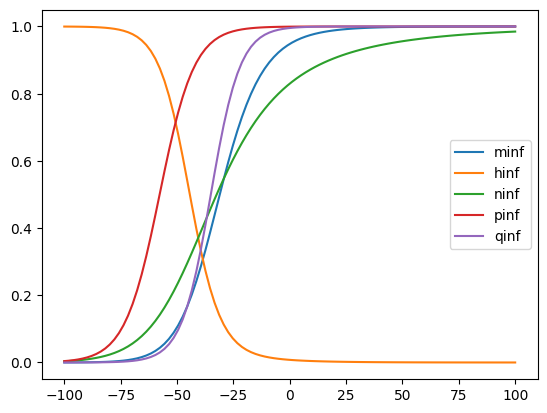

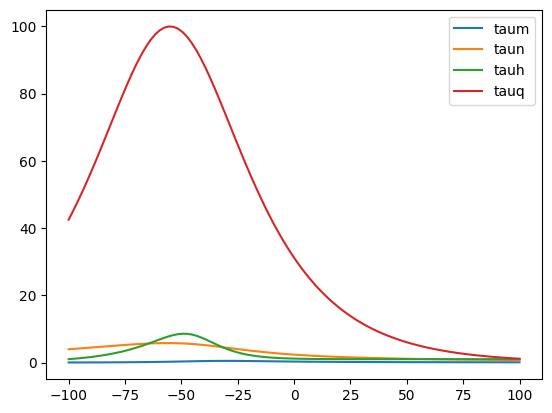

In [84]:
import matplotlib.pyplot as plt
import numpy as np 

vv = np.linspace(-100,100,100)
tauq0 = 200;
def minf(V):
    return 0.1*(V+31)/(1-np.exp(-0.1*(V+31)))/(0.1*(V+31)/(1-np.exp(-0.1*(V+31)))+4*np.exp(-(V+56)/18))
def taum(V):
    return 1/(0.1*(V+31)/(1-np.exp(-0.1*(V+31)))+4*np.exp(-(V+56)/18))
def hinf(V):
    return 0.07*np.exp(-(V+47)/20)/(0.07*np.exp(-(V+47)/20)+1/(np.exp(-0.1*(V+17))+1))
def tauh(V):
    return 1/(0.07*np.exp(-(V+47)/20)+1/(np.exp(-0.1*(V+17))+1))
def ninf(V):
    return 0.01*(V+34)/(1-np.exp(-0.1*(V+34)))/(0.01*(V+34)/(1-np.exp(-0.1*(V+34)))+0.125*np.exp(-(V+44)/80))
def taun(V):
    return  1/(0.01*(V+34)/(1-np.exp(-0.1*(V+34)))+0.125*np.exp(-(V+44)/80))
def pinf(V):
    return 1/(1+np.exp(-(V+57.7)/7.7))
def qinf(V):
    return 1/(1+np.exp(-(V+35)/6.5))
def tauq(V):
    return tauq0/(np.exp(-(V+55)/30)+np.exp((V+55)/30))
def Hinf(V):
    return 1./(1. + np.exp((V + 84.)/10.2))
def tauH(V):
    return  1./(np.exp(-17.9 - 0.116*V ) + np.exp(-1.84 + 0.09*V )) + 0.1


plt.plot(vv,minf(vv),label = "minf")
plt.plot(vv,hinf(vv),label = "hinf")
plt.plot(vv,ninf(vv),label = "ninf")
plt.plot(vv,pinf(vv),label = "pinf")
plt.plot(vv,qinf(vv),label = "qinf")
plt.legend()
plt.show()
plt.plot(vv,taum(vv),label = "taum")
plt.plot(vv,taun(vv),label = "taun")
plt.plot(vv,tauh(vv),label = "tauh")
plt.plot(vv,tauq(vv),label = "tauq")
plt.legend()
plt.show()



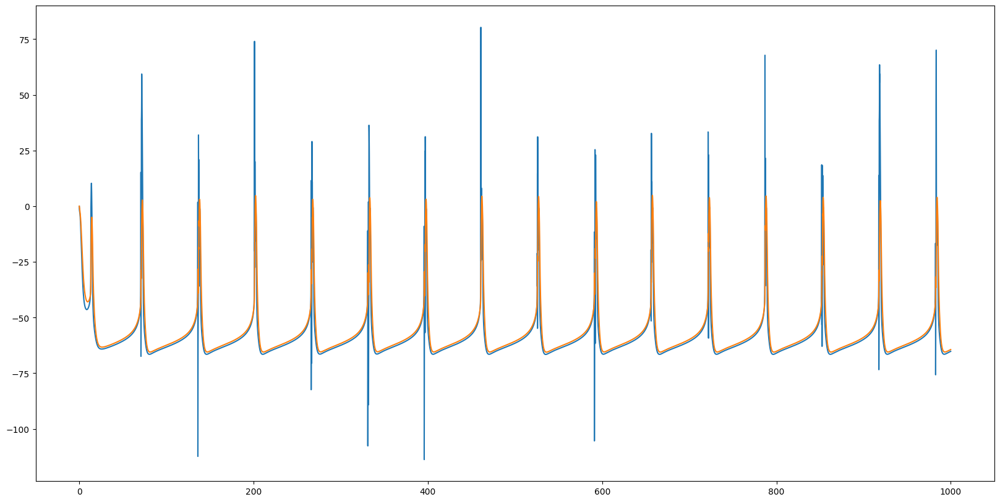

In [ ]:
# ======= OG KWL model =======

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
    
dt = 0.1
tstep = dt
t = np.arange(0,1000,dt)

Cm = 1;
El = -65;
Ena = 55;
Ek = -90;
Gls = 0.18;
Gld = 0.18;
Gna = 45;
Gk = 20;
Gnap = 0.12;
Gks = 0.8;
Iapps = -5;
Iappd = 4;

phih = 3.33;
phin = 3.33;
phiq = 1;

Gc = 1;
p = 0.15;

Gsd = Gc/p;
Gds = Gc/(1-p);

Iapps = -5;
Iappd = 4;

Vs = np.zeros(len(t))
Vd = np.zeros(len(t))
h = np.zeros(len(t))
n = np.zeros(len(t))
q = np.zeros(len(t))

Vs[1] = El
Vd[1] = El


for k in range(len(t) - 1):
    
    k1vs = (-Gls*(Vs[k]-El)-Gna*(minf(Vs[k])**3)*h[k]*(Vs[k]-Ena)
    -Gk*(n[k]**4)*(Vs[k]-Ek)-Gsd*(Vs[k]-Vd[k]) + Iapps)/Cm

    k1vd = (-Gld*(Vd[k]-El)-Gnap*(pinf(Vd[k])**3)*(Vd[k]-Ena)-Gks*q[k]*(Vd[k]-Ek)-Gds*(Vd[k]-Vs[k]) + Iappd)/Cm

    k1h = (hinf(Vs[k])-h[k])/tauh(Vs[k]);
    k1n = (ninf(Vs[k])-n[k])/taun(Vs[k]);
    k1q = phiq*(qinf(Vd[k])-q[k])/tauq(Vd[k])
    
    avs = Vs[k]+k1vs*tstep;
    avd = Vd[k]+k1vd*tstep;
    ah = h[k]+k1h*tstep;
    an = n[k]+k1n*tstep;
    aq = q[k]+k1q*tstep;

    k2vs = (-Gls*(avs-El)-Gna*(minf(avs)**3)*ah*(avs-Ena)
    -Gk*(an**4)*(avs-Ek)-Gsd*(avs-avd) + Iapps)/Cm

    k2vd = (-Gld*(avd-El)-Gnap*(pinf(avd)**3)*(avd-Ena)-Gks*aq*(avd-Ek)-Gds*(avd-avs) + Iappd)/Cm

    k2h = (hinf(avs)-ah)/tauh(avs)
    k2n = (ninf(avs)-an)/taun(avs)
    k2q = phiq*(qinf(avd)-aq)/tauq(avd)
   
    Vs[k+1] = Vs[k]+(k1vs+k2vs)*tstep/2
    Vd[k+1] = Vd[k]+(k1vd+k2vd)*tstep/2
    h[k+1] = h[k]+(k1h+k2h)*tstep/2
    n[k+1] = n[k]+(k1n+k2n)*tstep/2
    q[k+1] = q[k]+(k1q+k2q)*tstep/2
    
plt.figure(figsize=(20,10))
plt.plot(t,Vs)
plt.plot(t,Vd)


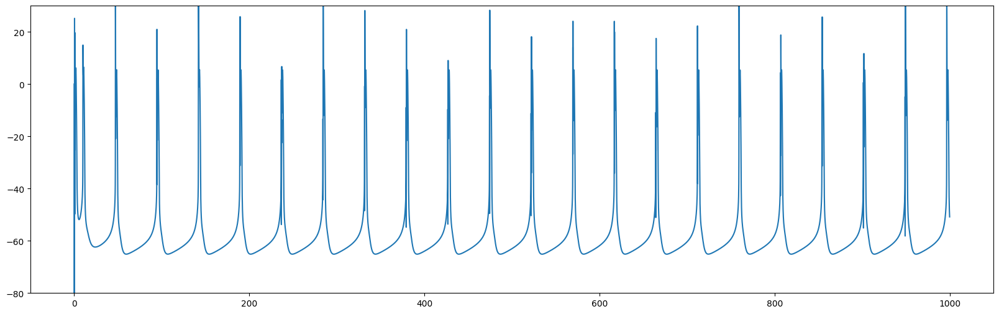

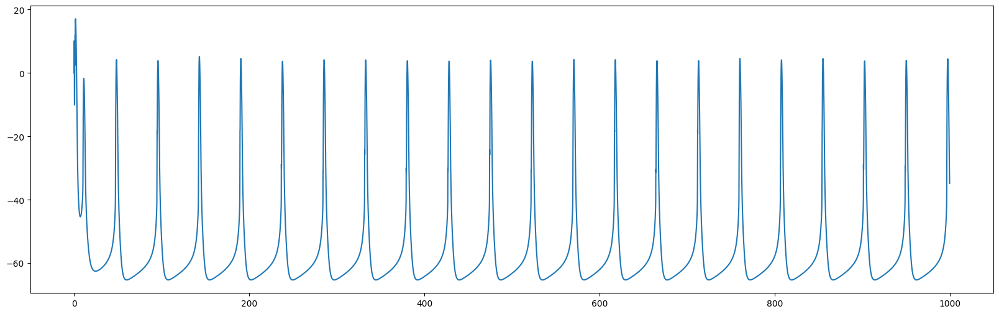

In [99]:
# ======= Reduced KWL model =======

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
    
dt = 0.1
tstep = dt
t = np.arange(0,1000,dt)

Cm = 1;
El = -65;
Ena = 55;
Ek = -90;
Gls = 0.18;
Gld = 0.18;
Gna = 45;
Gk = 20;
Gnap = 0.2;
Gks = 1;
Iapps = -5;
Iappd = 4;

phih = 3.33;
phin = 3.33;
phiq = 1;

Gc = 1;
p = 0.15;

Gsd = Gc/p;
Gds = Gc/(1-p);

Iapps = 2;
Iappd = 4;


Vs = np.zeros(len(t))
Vd = np.zeros(len(t))
h = np.zeros(len(t))
n = np.zeros(len(t))
q = np.zeros(len(t))

Vs[1] = El
Vd[1] = El

a = 0.8 
c = 1 

for k in range(len(t) - 1):
    
    k1vs = (-Gls*(Vs[k]-El)-Gna*(minf(Vs[k])**3)*(a - c * n[k])*(Vs[k]-Ena)
    -Gk*(n[k]**4)*(Vs[k]-Ek)-Gsd*(Vs[k]-Vd[k]) + Iapps)/Cm

    k1vd = (-Gld*(Vd[k]-El)-Gnap*(pinf(Vd[k])**3)*(Vd[k]-Ena)-Gks*q[k]*(Vd[k]-Ek)-Gds*(Vd[k]-Vs[k]) + Iappd)/Cm

    k1h = (hinf(Vs[k])-h[k])/tauh(Vs[k]);
    k1n = (ninf(Vs[k])-n[k])/taun(Vs[k]);
    k1q = phiq*(qinf(Vd[k])-q[k])/tauq(Vd[k])
    
    avs = Vs[k]+k1vs*tstep;
    avd = Vd[k]+k1vd*tstep;
    ah = h[k]+k1h*tstep;
    an = n[k]+k1n*tstep;
    aq = q[k]+k1q*tstep;

    k2vs = (-Gls*(avs-El)-Gna*(minf(avs)**3)*(a - c * an)*(avs-Ena)
    -Gk*(an**4)*(avs-Ek)-Gsd*(avs-avd) + Iapps)/Cm

    k2vd = (-Gld*(avd-El)-Gnap*(pinf(avd)**3)*(avd-Ena)-Gks*aq*(avd-Ek)-Gds*(avd-avs) + Iappd)/Cm

    k2h = (hinf(avs)-ah)/tauh(avs)
    k2n = (ninf(avs)-an)/taun(avs)
    k2q = phiq*(qinf(avd)-aq)/tauq(avd)
   
    Vs[k+1] = Vs[k]+(k1vs+k2vs)*tstep/2
    Vd[k+1] = Vd[k]+(k1vd+k2vd)*tstep/2
    h[k+1] = h[k]+(k1h+k2h)*tstep/2
    n[k+1] = n[k]+(k1n+k2n)*tstep/2
    q[k+1] = q[k]+(k1q+k2q)*tstep/2
    
plt.figure(figsize=(20,6))
plt.ylim(-80,30)
#plt.xlim(200,400)
plt.plot(t,Vs)
plt.show()
plt.figure(figsize=(20,6))
plt.plot(t,Vd)
plt.show()


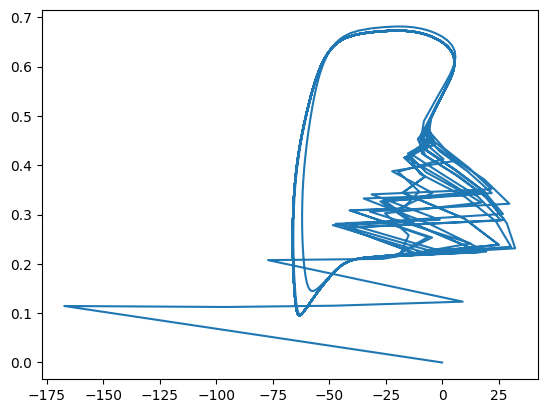

In [26]:
plt.plot(Vs,n)

In [67]:
V_range = np.linspace(-80, 20, 400)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))

line_vs_null, = ax1.plot([], [], 'r', lw=2)
line_zs_null, = ax1.plot([], [], 'b', lw=2)
traj_sz, = ax1.plot([], [], 'k', alpha=0.6)
pt_sz, = ax1.plot([], [], 'ko', ms=4)
ax1.set_xlim(-80, 20)
ax1.set_ylim(0, 1)
ax1.set_xlabel("Vs (mV)")
ax1.set_ylabel("Zs")
ax1.set_title("Vs - Zs phase plane")

line_vd_null, = ax2.plot([], [], 'r', lw=2)
line_hd_null, = ax2.plot([], [], 'b', lw=2)
traj_dh, = ax2.plot([], [], 'k', alpha=0.6)
pt_dh, = ax2.plot([], [], 'ko', ms=4)
ax2.set_xlim(-80, 20)
ax2.set_ylim(0, 1)
ax2.set_xlabel("Vd (mV)")
ax2.set_ylabel("Hd")
ax2.set_title("Vd - Hd phase plane")

h_constant = 1
def compute_vs_null(Vs_eval, k_idx):
    denom = Gk*(Vs_eval - Ek)
    numer = -Gls*(Vs_eval - El) - Gsd*(Vs_eval - Vd[k_idx])-Gna*(minf(Vs_eval)**3)*(a-c*n[k_idx])*(Vs_eval-Ena) + Iapps 
    with np.errstate(divide='ignore', invalid='ignore'):
        Z_null = numer / denom
    return Z_null

    
def compute_vd_null(Vd_eval, k_idx):
    denom = Gks*(Vd_eval - Ek)
    numer = -Gld*(Vd_eval - El) - Gds*(Vd_eval - Vs[k_idx])- Gnap*pinf(Vd_eval)*(Vd_eval - Ena) + Iappd
    with np.errstate(divide='ignore', invalid='ignore'):
        H_null = numer / denom
    return H_null

def init():
    line_vs_null.set_data([], [])
    line_zs_null.set_data([], [])
    traj_sz.set_data([], [])
    pt_sz.set_data([], [])
    line_vd_null.set_data([], [])
    line_hd_null.set_data([], [])
    traj_dh.set_data([], [])
    pt_dh.set_data([], [])
    return (line_vs_null, line_zs_null, traj_sz, pt_sz,
            line_vd_null, line_hd_null, traj_dh, pt_dh)

step = max(1, int(len(t) / 100))
n_frames = int(np.ceil(len(t) / step))

def animate(frame):
    k_idx = min(frame * step, len(t)-1)
    Z_null_vs = compute_vs_null(V_range, k_idx)
    Z_null_vs = np.clip(Z_null_vs, -0.05, 1.0)
    H_null_vd = compute_vd_null(V_range, k_idx)
    H_null_vd = np.clip(H_null_vd, -0.05, 1.0)

    line_vs_null.set_data(V_range, Z_null_vs)
    line_zs_null.set_data(V_range, ninf(V_range))
    traj_sz.set_data(Vs[:k_idx], n[:k_idx])
    pt_sz.set_data(Vs[k_idx], n[k_idx])
    #vline_sz = ax1.axvline(x=Vreset, color='gray', linestyle='--')

    line_vd_null.set_data(V_range, H_null_vd)
    line_hd_null.set_data(V_range, qinf(V_range))
    traj_dh.set_data(Vd[:k_idx], q[:k_idx])
    pt_dh.set_data(Vd[k_idx], q[k_idx])
    #vline_dh = ax2.axvline(x=Vreset, color='gray', linestyle='--')

    return (line_vs_null, line_zs_null, traj_sz, pt_sz,
            line_vd_null, line_hd_null, traj_dh, pt_dh)

ani = animation.FuncAnimation(fig, animate, frames=n_frames, init_func=init, interval=100, blit=False, repeat=False)
plt.close(fig)
HTML(ani.to_jshtml())

C:\Users\schre\AppData\Local\Temp\ipykernel_7584\451977925.py:66: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  pt_sz.set_data(Vs[k_idx], n[k_idx])
C:\Users\schre\AppData\Local\Temp\ipykernel_7584\451977925.py:72: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  pt_dh.set_data(Vd[k_idx], q[k_idx])


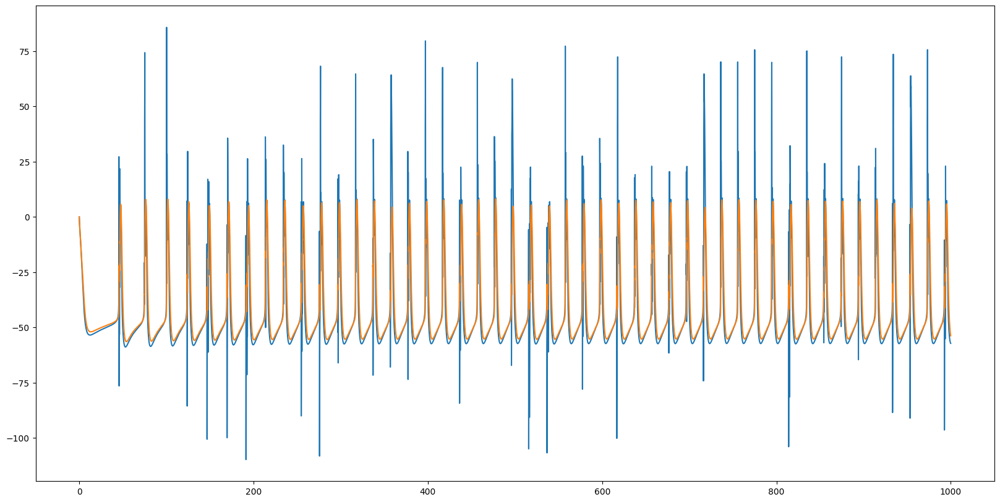

In [94]:
# ======= My version of KWL model (that makes sense to me) =======

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
    
dt = 0.1
tstep = dt
t = np.arange(0,1000,dt)

Cm = 1;
El = -65;
Ena = 55;
Ek = -90;
Eh = -39
Gls = 0.18;
Gld = 0.18;
Gna = 55;
Gk = 12;
Gnap = 0.12;
Gks = 0.8;
Gh = 1
Iapps = -5;
Iappd = 4;


phih = 3.33;
phin = 3.33;
phiq = 1;

Gc = 1;
p = 0.15;

Gsd = Gc/p;
Gds = Gc/(1-p);

Iapps = -5;
Iappd = 4;

Vs = np.zeros(len(t))
Vd = np.zeros(len(t))
h = np.zeros(len(t))
n = np.zeros(len(t))
q = np.zeros(len(t))
Hd = np.zeros(len(t))

Vs[1] = El
Vd[1] = El


for k in range(len(t) - 1):
    
    k1vs = (-Gls*(Vs[k]-El)-Gna*(minf(Vs[k])**3)*h[k]*(Vs[k]-Ena)
    -Gk*(n[k]**4)*(Vs[k]-Ek)-Gsd*(Vs[k]-Vd[k]) + Iapps)/Cm

    k1vd = (-Gld*(Vd[k]-El)- Gh*Hd[k]*(Vd[k]-Eh) -Gds*(Vd[k]-Vs[k]-Gnap*(pinf(Vd[k])**3)*(Vd[k]-Ena)-Gks*q[k]*(Vd[k]-Ek)) + Iappd)/Cm

    k1h = (hinf(Vs[k])-h[k])/tauh(Vs[k]);
    k1n = (ninf(Vs[k])-n[k])/taun(Vs[k]);
    k1q = phiq*(qinf(Vd[k])-q[k])/tauq(Vd[k])
    k1Hd = (Hinf(Vd[k])-Hd[k])/tauH(Vd[k])
    
    avs = Vs[k]+k1vs*tstep;
    avd = Vd[k]+k1vd*tstep;
    ah = h[k]+k1h*tstep;
    an = n[k]+k1n*tstep;
    aq = q[k]+k1q*tstep;
    aHd = Hd[k]+k1Hd*dt

    k2vs = (-Gls*(avs-El)-Gna*(minf(avs)**3)*ah*(avs-Ena)
    -Gk*(an**4)*(avs-Ek)-Gsd*(avs-avd) + Iapps)/Cm

    k2vd = (-Gld*(avd-El)- Gh*Hd[k]*(Vd[k]-Eh)-Gds*(avd-avs)-Gnap*(pinf(avd)**3)*(avd-Ena)-Gks*aq*(avd-Ek) + Iappd)/Cm

    k2h = (hinf(avs)-ah)/tauh(avs)
    k2n = (ninf(avs)-an)/taun(avs)
    k2q = phiq*(qinf(avd)-aq)/tauq(avd)
    k2Hd = (Hinf(avd)-aHd)/tauH(avd)
   
    Vs[k+1] = Vs[k]+(k1vs+k2vs)*tstep/2
    Vd[k+1] = Vd[k]+(k1vd+k2vd)*tstep/2
    h[k+1] = h[k]+(k1h+k2h)*tstep/2
    n[k+1] = n[k]+(k1n+k2n)*tstep/2
    q[k+1] = q[k]+(k1q+k2q)*tstep/2
    Hd[k+1] = Hd[k]+(k1Hd+k2Hd)*dt/2
    
plt.figure(figsize=(20,10))
plt.plot(t,Vs)
plt.plot(t,Vd)
